# Gradient Descent for Temperatures
### The following script contains the following:

#### 1. Import libraries and data
#### 2. We'll need to reduce the dataset to only one year of data.
#### 3. Reduce Data Set to 3 Different Weather Stations and Years
#### 4. 3D visualization of the temperatures over
#### 5. Analyze DEBILT_Temp_Mean, 2022
#### 6. Analyze DUSSELDORF_Temp_Mean, 2021
#### 7. Analyze MAASTRICHT_Temp_Mean, 2020ean, 2020
---------------------------------------------------------------------------------------------------------------------------
## 1. Import libraries and data
---------------------------------------------------------------------------------------------------------------------------

In [744]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib.pyplot as plt
import os
from mpl_toolkits.mplot3d import Axes3D
import sklearn
from sklearn.preprocessing import StandardScaler
from plotly.offline import download_plotlyjs, init_notebook_mode
from plotly.offline import plot, iplot
import plotly.graph_objects as go

In [746]:
%matplotlib inline

# Turning off warning feature
import warnings
warnings.filterwarnings('ignore')

# Supress scientific notation for easier analysis profiling
pd.set_option('display.float_format', '{:.2f}'.format)

pd.set_option('display.max_columns', None)

In [748]:
#Create a path to where your data is stored.
path = r'C:\Users\IVON6\ClimateWins'

In [750]:
#Read in the European weather data.
climate = pd.read_csv(os.path.join(path, '02 Data', 'Original Data', 'Dataset-weather-prediction-dataset-processed.csv'), index_col=False)
climate.head()

,DATE,MONTH,BASEL_cloud_cover,BASEL_wind_speed,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_snow_depth,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,BELGRADE_humidity,BELGRADE_pressure,BELGRADE_global_radiation,BELGRADE_precipitation,BELGRADE_sunshine,BELGRADE_temp_mean,BELGRADE_temp_min,BELGRADE_temp_max,BUDAPEST_cloud_cover,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_global_radiation,BUDAPEST_precipitation,BUDAPEST_sunshine,BUDAPEST_temp_mean,BUDAPEST_temp_min,BUDAPEST_temp_max,DEBILT_cloud_cover,DEBILT_wind_speed,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max,DUSSELDORF_cloud_cover,DUSSELDORF_wind_speed,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_snow_depth,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max,GDANSK_cloud_cover,GDANSK_humidity,GDANSK_precipitation,GDANSK_snow_depth,GDANSK_temp_mean,GDANSK_temp_min,GDANSK_temp_max,HEATHROW_cloud_cover,HEATHROW_humidity,HEATHROW_pressure,HEATHROW_global_radiation,HEATHROW_precipitation,HEATHROW_snow_depth,HEATHROW_sunshine,HEATHROW_temp_mean,HEATHROW_temp_min,HEATHROW_temp_max,KASSEL_wind_speed,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_temp_min,KASSEL_temp_max,LJUBLJANA_cloud_cover,LJUBLJANA_wind_speed,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max,MAASTRICHT_cloud_cover,MAASTRICHT_wind_speed,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max,MADRID_cloud_cover,MADRID_wind_speed,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_snow_depth,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max,OSLO_cloud_cover,OSLO_wind_speed,OSLO_humidity,OSLO_pressure,OSLO_global_radiation,OSLO_precipitation,OSLO_snow_depth,OSLO_sunshine,OSLO_temp_mean,OSLO_temp_min,OSLO_temp_max,ROMA_cloud_cover,ROMA_wind_speed,ROMA_humidity,ROMA_pressure,ROMA_sunshine,ROMA_temp_mean,SONNBLICK_cloud_cover,SONNBLICK_wind_speed,SONNBLICK_humidity,SONNBLICK_pressure,SONNBLICK_global_radiation,SONNBLICK_precipitation,SONNBLICK_sunshine,SONNBLICK_temp_mean,SONNBLICK_temp_min,SONNBLICK_temp_max,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max,TOURS_wind_speed,TOURS_humidity,TOURS_pressure,TOURS_global_radiation,TOURS_precipitation,TOURS_temp_mean,TOURS_temp_min,TOURS_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_snow_depth,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max
0,19600101,1,7,2.10,0.85,1.02,0.32,0.09,0,0.70,6.50,0.80,10.90,1,0.81,1.02,0.88,0.00,7.00,3.70,-0.90,7.90,4,0.67,1.02,0.44,0.01,2.30,2.40,-0.40,5.10,7,7.70,0.85,1.00,0.07,0.25,0.00,9.30,7.40,11.00,8,5.40,0.83,1.02,0.12,0.08,0,0.00,10.00,7.00,11.50,8,0.91,0.00,0,0.80,-0.30,1.60,7,0.91,1.00,0.13,0.22,0,0.00,10.60,9.40,8.30,2.90,0.82,1.01,0.28,0.48,1.60,7.90,3.90,9.40,8,1.40,1.00,1.02,0.20,0.00,0.00,-0.60,-1.90,0.50,7,8.70,0.83,1.01,0.22,0.32,1.00,9.50,8.50,11.10,6,0.00,0.92,1.03,0.53,0.00,1.40,7.60,4.40,10.80,5,0.67,0.20,0.10,0,0.00,6.90,1.10,10.40,8,4.00,0.98,1.00,0.04,1.14,0,0.00,4.90,3.80,5.90,3,2.60,0.73,1.02,7.10,7.80,4,4.50,0.73,1.03,0.48,0.01,2.30,-5.90,-8.50,-3.20,5,1.01,0.05,0.32,0.00,4.20,2.20,4.90,3.80,0.76,1.02,1.54,0.44,10.00,7.80,12.20,5,0.88,1.00,0.45,0

In [752]:
#Reduce to just the mean temperatures
df = climate[['DATE', 'MONTH','BASEL_temp_mean',
 'BELGRADE_temp_mean',
 'BUDAPEST_temp_mean',
 'DEBILT_temp_mean',
 'DUSSELDORF_temp_mean',
 'GDANSK_temp_mean',
 'HEATHROW_temp_mean',
 'KASSEL_temp_mean',
 'LJUBLJANA_temp_mean',
 'MAASTRICHT_temp_mean',
 'MADRID_temp_mean',
 'MUNCHENB_temp_mean',
 'OSLO_temp_mean',
 'ROMA_temp_mean',
 'SONNBLICK_temp_mean',
 'STOCKHOLM_temp_mean',
 'TOURS_temp_mean',
 'VALENTIA_temp_mean']].copy()

In [754]:
df

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,19600101,1,6.50,3.70,2.40,9.30,10.00,0.80,10.60,7.90,-0.60,9.50,7.60,6.90,4.90,7.80,-5.90,4.20,10.00,8.50
1,19600102,1,6.10,2.90,2.30,7.70,8.20,1.60,6.10,7.70,2.10,8.60,9.80,6.20,3.40,12.20,-9.50,4.00,9.50,8.90
2,19600103,1,8.50,3.10,2.70,6.80,7.10,0.70,8.40,6.50,4.60,6.90,8.60,5.80,1.90,10.20,-9.50,2.40,10.30,10.50
3,19600104,1,6.30,2.00,2.00,6.70,6.80,-0.10,9.40,5.80,3.20,7.00,10.30,3.90,3.00,10.80,-11.50,1.20,11.20,7.40
4,19600105,1,3.00,2.00,2.50,8.00,7.70,0.40,8.90,5.40,3.60,8.10,12.10,1.80,3.70,9.90,-9.30,3.30,11.40,5.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,15.90,18.20,11.70,15.70,17.80,11.50,16.40,9.10,14.70,18.60,20.00,14.30,9.70,15.40,0.60,11.50,19.90,10.70
22946,20221028,10,16.70,15.90,11.70,16.00,19.40,11.70,15.80,9.10,12.90,18.90,19.10,16.10,10.90,15.40,2.30,12.50,20.30,10.70
22947,20221029,10,16.70,13.40,11.70,15.80,18.20,14.20,16.50,9.10,13.20,18.20,19.00,17.40,9.70,15.40,3.30,13.10,20.60,10.70
22948,20221030,10,15.40,15.00,11.70,14.40,16.70,11.00,15.20,9.10,14.00,16.30,15.70,14.50,5.90,15.40,3.40,7.50,15.90,10.70


In [756]:
df.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00,22950.00
mean,19909835.76,6.51,10.39,12.66,11.74,10.02,10.72,8.05,11.21,9.14,10.72,10.15,14.93,9.01,6.44,15.40,-5.05,7.34,11.64,10.72
std,181383.27,3.44,7.36,8.81,8.50,6.32,6.79,7.82,5.72,6.77,8.26,6.67,7.42,7.96,8.24,5.94,6.84,8.04,6.37,3.33
min,19600101.00,1.00,-18.50,-17.30,-16.50,-13.20,-14.60,-23.80,-8.90,-15.80,-15.50,-14.90,-4.50,-22.50,-22.00,-5.60,-31.80,-23.90,-12.60,-3.50
25%,19750916.25,4.00,4.70,5.70,4.90,5.50,5.70,2.20,6.80,4.60,3.90,5.30,8.70,2.90,0.40,11.10,-9.80,1.30,7.10,8.80
50%,19910601.50,7.00,10.70,13.40,11.80,10.20,10.90,8.00,11.20,9.10,11.20,10.30,14.00,9.40,6.40,15.40,-4.70,7.00,11.60,10.70
75%,20070214.75,9.00,16.20,19.80,18.60,14.90,15.90,14.60,15.80,13.97,17.40,15.20,21.20,15.30,13.40,19.70,0.10,14.10,16.50,13.00
max,20221031.00,12.00,29.20,34.60,33.10,29.70,31.20,27.60,30.90,28.40,30.40,30.90,33.40,29.50,26.40,31.50,12.70,28.30,31.20,23.60


---------------------------------------------------------------------------------------------------------------------------
## 2. Reduce the dataset to only one year of data.

In [759]:
#You'll need to reduce the dataset to only one year of data. Analyze and pick which year you want to use.

In [761]:
df['DATE'].describe() #View statistics of all years

count      22950.00
mean    19909835.76
std       181383.27
min     19600101.00
25%     19750916.25
50%     19910601.50
75%     20070214.75
max     20221031.00
Name: DATE, dtype: float64

In [763]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
nodate = df.drop(['DATE','MONTH'], axis=1)

In [765]:
#create a scaler object using StandardScaler from sklearn.preprocessing

scaler = StandardScaler()

#create new df with scaled data

nodate_scaled = pd.DataFrame(scaler.fit_transform(nodate))
nodate_scaled.columns = nodate.columns

nodate_scaled.head()

,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
0,-0.53,-1.02,-1.10,-0.11,-0.11,-0.93,-0.11,-0.18,-1.37,-0.10,-0.99,-0.27,-0.19,-1.28,-0.12,-0.39,-0.26,-0.67
1,-0.58,-1.11,-1.11,-0.37,-0.37,-0.83,-0.89,-0.21,-1.04,-0.23,-0.69,-0.35,-0.37,-0.54,-0.65,-0.42,-0.34,-0.55
2,-0.26,-1.08,-1.06,-0.51,-0.53,-0.94,-0.49,-0.39,-0.74,-0.49,-0.85,-0.40,-0.55,-0.88,-0.65,-0.62,-0.21,-0.07
3,-0.56,-1.21,-1.15,-0.53,-0.58,-1.04,-0.32,-0.49,-0.91,-0.47,-0.62,-0.64,-0.42,-0.78,-0.94,-0.76,-0.07,-1.00
4,-1.00,-1.21,-1.09,-0.32,-0.44,-0.98,-0.40,-0.55,-0.86,-0.31,-0.38,-0.91,-0.33,-0.93,-0.62,-0.50,-0.04,-1.51


In [767]:
#Look at a whisker plot of the data to see variations in temperatures
nodate.boxplot(figsize=(15,15))
plt.xticks(rotation=90)


(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18]),
 [Text(1, 0, 'BASEL_temp_mean'),
  Text(2, 0, 'BELGRADE_temp_mean'),
  Text(3, 0, 'BUDAPEST_temp_mean'),
  Text(4, 0, 'DEBILT_temp_mean'),
  Text(5, 0, 'DUSSELDORF_temp_mean'),
  Text(6, 0, 'GDANSK_temp_mean'),
  Text(7, 0, 'HEATHROW_temp_mean'),
  Text(8, 0, 'KASSEL_temp_mean'),
  Text(9, 0, 'LJUBLJANA_temp_mean'),
  Text(10, 0, 'MAASTRICHT_temp_mean'),
  Text(11, 0, 'MADRID_temp_mean'),
  Text(12, 0, 'MUNCHENB_temp_mean'),
  Text(13, 0, 'OSLO_temp_mean'),
  Text(14, 0, 'ROMA_temp_mean'),
  Text(15, 0, 'SONNBLICK_temp_mean'),
  Text(16, 0, 'STOCKHOLM_temp_mean'),
  Text(17, 0, 'TOURS_temp_mean'),
  Text(18, 0, 'VALENTIA_temp_mean')])

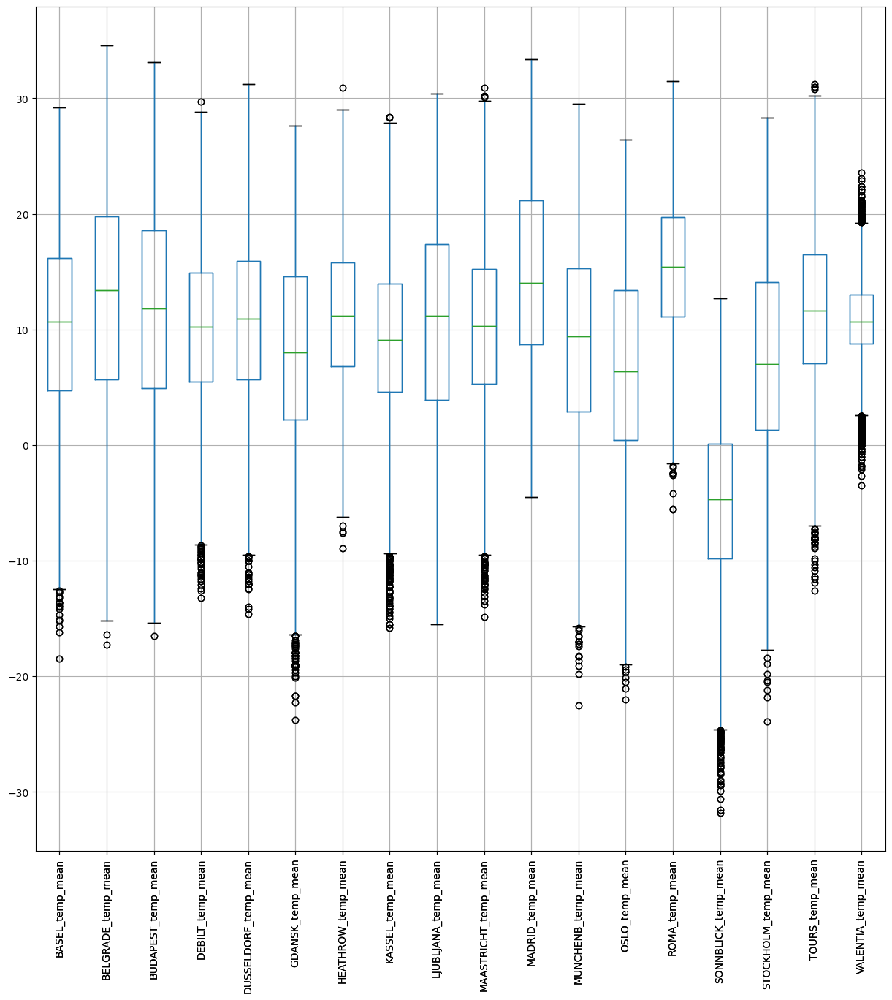

In [769]:
#Look at a whisker plot of the data to see variations in temperatures
nodate.boxplot(figsize=(15,15))
plt.xticks(rotation=90)
plt.show()

---------------------------------------------------------------------------------------------------------------------------
### 3. Reduce Data Set to 3 Different Weather Stations and Years

In [772]:
#Reduce your dataset to a single year '2020'
#dfyear20 = df[df['DATE'].astype(str).str.contains('2020')] #filters by all combinations
dfyear20 = df[df['DATE'].astype(str).str[:4] == '2020'] #filters by first 4 digits of #year [:4]
dfyear20

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
21915,20200101,1,-0.40,2.00,3.80,0.80,1.30,2.30,4.90,9.10,-0.60,-0.60,6.60,0.80,1.90,15.40,-6.10,3.50,6.10,10.70
21916,20200102,1,0.10,2.60,1.80,3.90,2.40,0.60,7.80,9.10,-2.70,3.50,6.00,-1.50,4.10,15.40,-5.40,5.80,9.00,10.70
21917,20200103,1,5.30,0.70,-1.60,7.60,7.70,1.80,9.00,9.10,-1.00,7.50,3.80,3.50,4.50,15.40,-5.00,5.40,9.80,10.70
21918,20200104,1,6.00,-0.60,2.70,6.70,5.10,3.70,5.60,9.10,1.60,5.00,7.00,4.30,0.70,15.40,-9.80,2.40,5.40,10.70
21919,20200105,1,1.70,3.40,2.90,6.90,6.40,2.40,7.50,9.10,0.60,5.90,6.20,2.50,-0.10,15.40,-14.50,0.10,6.40,10.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22276,20201227,12,1.70,2.70,0.10,5.00,4.80,0.10,6.20,9.10,-0.70,4.30,2.80,-2.10,2.90,15.40,-12.90,4.20,5.60,10.70
22277,20201228,12,4.60,8.00,4.40,3.60,4.30,2.50,1.00,9.10,0.30,2.90,5.70,0.30,1.30,15.40,-13.10,4.20,4.40,10.70
22278,20201229,12,4.40,11.50,8.80,3.70,1.50,4.30,2.40,9.10,2.90,2.10,4.50,2.80,2.30,15.40,-13.50,4.40,5.00,10.70
22279,20201230,12,2.60,12.20,7.50,4.20,3.60,1.50,2.50,9.10,3.00,3.40,4.80,2.20,1.70,15.40,-13.80,2.80,4.50,10.70


In [774]:
dfyear20.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00,366.00
mean,20200667.12,6.51,12.13,14.35,13.21,11.69,12.26,9.98,12.59,9.10,12.13,12.01,16.01,11.00,8.71,15.40,-3.29,9.72,13.68,10.70
std,345.77,3.46,6.88,8.07,7.85,5.57,6.15,6.37,5.58,0.00,7.57,6.09,7.44,6.96,6.45,0.00,6.07,6.34,5.88,0.00
min,20200101.00,1.00,-2.00,-1.70,-1.70,0.60,-0.20,-2.40,-0.90,9.10,-2.70,-1.40,2.80,-2.40,-4.20,15.40,-19.50,-1.30,1.80,10.70
25%,20200401.25,4.00,6.33,7.72,6.72,7.30,7.30,4.72,8.30,9.10,5.40,7.30,10.20,5.22,3.50,15.40,-7.05,4.70,9.00,10.70
50%,20200701.50,7.00,12.15,14.75,13.25,11.50,11.90,9.15,11.80,9.10,12.45,11.70,14.25,11.35,7.35,15.40,-3.35,8.25,13.70,10.70
75%,20200983.25,9.75,17.60,21.35,19.80,15.70,16.50,15.47,17.10,9.10,18.35,16.48,22.32,16.60,13.57,15.40,1.20,14.97,17.80,10.70
max,20201231.00,12.00,27.40,29.80,28.20,27.00,27.70,24.00,28.60,9.10,26.70,28.70,32.20,26.10,24.60,15.40,10.20,24.70,28.60,10.70


In [776]:
#Reduce your dataset to a single year '2021'
#dfyear21 = df[df['DATE'].astype(str).str.contains('2021')] #filters by all combinations
dfyear21 = df[df['DATE'].astype(str).str[:4] == '2021'] #filters by first 4 digits of #year [:4]
dfyear21

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
22281,20210101,1,2.20,6.90,11.70,3.00,2.30,-1.90,1.40,9.10,2.50,2.00,4.00,0.20,0.30,15.40,-13.30,3.00,2.10,10.70
22282,20210102,1,1.40,7.80,11.70,3.60,2.60,-0.40,2.60,9.10,4.60,1.60,2.20,-1.10,0.90,15.40,-11.10,1.70,0.40,10.70
22283,20210103,1,0.20,9.00,11.70,3.30,3.00,-0.10,3.30,9.10,3.60,2.10,3.00,-0.60,-1.40,15.40,-12.00,-0.20,2.30,10.70
22284,20210104,1,0.60,8.10,11.70,2.80,2.10,0.70,4.00,9.10,3.40,1.50,2.70,-0.90,-3.00,15.40,-13.20,0.40,1.60,10.70
22285,20210105,1,0.20,6.50,11.70,2.90,2.30,1.80,3.20,9.10,3.50,1.70,1.50,-1.30,-6.60,15.40,-14.50,-0.50,2.10,10.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22641,20211227,12,6.60,1.40,11.70,5.60,6.50,-9.00,8.50,9.10,3.20,8.20,12.20,4.60,-8.50,15.40,-9.20,-3.90,11.40,10.70
22642,20211228,12,10.30,2.70,11.70,8.80,8.70,-7.00,10.00,9.10,5.80,9.20,11.40,6.40,-5.00,15.40,-7.70,-0.10,11.80,10.70
22643,20211229,12,9.60,5.20,11.70,9.50,9.70,-2.00,11.20,9.10,2.70,9.80,9.80,8.10,-5.90,15.40,-8.30,0.70,12.50,10.70
22644,20211230,12,13.00,5.20,11.70,12.90,13.60,1.20,12.40,9.10,3.20,13.50,9.80,12.20,-0.60,15.40,-4.70,2.70,13.60,10.70


In [778]:
dfyear21.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00,365.00
mean,20210668.32,6.53,10.63,13.79,11.70,10.48,10.81,8.75,11.70,9.10,11.56,10.56,15.60,9.73,7.28,15.40,-4.74,8.14,12.38,10.70
std,345.48,3.45,6.99,8.86,0.00,6.11,6.62,8.34,5.79,0.00,8.38,6.43,7.49,7.37,8.75,0.00,7.02,8.43,6.28,0.00
min,20210101.00,1.00,-5.90,-5.40,11.70,-5.80,-7.40,-15.30,-1.30,9.10,-4.60,-7.00,-3.40,-7.90,-11.30,15.40,-24.30,-11.10,-2.90,10.70
25%,20210402.00,4.00,4.90,7.10,11.70,5.70,6.10,2.20,7.30,9.10,4.90,5.70,10.00,3.70,1.70,15.40,-9.40,2.70,7.50,10.70
50%,20210702.00,7.00,10.30,12.30,11.70,10.30,10.30,8.00,11.20,9.10,10.00,10.00,14.30,9.30,7.00,15.40,-4.80,7.50,12.00,10.70
75%,20211001.00,10.00,16.90,20.90,11.70,16.30,16.70,16.10,16.90,9.10,18.50,16.30,21.00,15.90,15.20,15.40,0.80,14.90,17.80,10.70
max,20211231.00,12.00,25.70,32.60,11.70,24.00,28.10,26.20,24.90,9.10,28.00,26.30,33.40,25.80,23.60,15.40,10.10,26.30,25.10,10.70


In [780]:
#Reduce your dataset to a single year '2022'
#dfyear22 = df[df['DATE'].astype(str).str.contains('2022')] #filters by all combinations
dfyear22 = df[df['DATE'].astype(str).str[:4] == '2022'] #filters by first 4 digits of #year [:4]
dfyear22

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
22646,20220101,1,6.20,10.00,11.70,12.30,12.80,5.50,14.00,9.10,2.10,12.30,11.10,8.50,-2.30,15.40,-1.40,-0.30,9.50,10.70
22647,20220102,1,6.40,11.50,11.70,11.70,11.40,6.80,11.40,9.10,1.40,11.60,9.80,9.50,0.30,15.40,0.00,2.60,11.00,10.70
22648,20220103,1,11.30,9.70,11.70,9.70,9.70,7.40,9.80,9.10,5.20,9.10,9.70,10.30,1.10,15.40,-5.00,4.30,11.80,10.70
22649,20220104,1,11.60,10.20,11.70,6.50,6.80,5.20,7.70,9.10,9.50,6.10,8.60,10.50,-2.60,15.40,-5.90,1.30,10.50,10.70
22650,20220105,1,3.10,14.00,11.70,5.10,3.80,2.40,3.80,9.10,6.50,3.10,6.60,1.90,-2.40,15.40,-11.40,-1.70,4.10,10.70
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,10,15.90,18.20,11.70,15.70,17.80,11.50,16.40,9.10,14.70,18.60,20.00,14.30,9.70,15.40,0.60,11.50,19.90,10.70
22946,20221028,10,16.70,15.90,11.70,16.00,19.40,11.70,15.80,9.10,12.90,18.90,19.10,16.10,10.90,15.40,2.30,12.50,20.30,10.70
22947,20221029,10,16.70,13.40,11.70,15.80,18.20,14.20,16.50,9.10,13.20,18.20,19.00,17.40,9.70,15.40,3.30,13.10,20.60,10.70
22948,20221030,10,15.40,15.00,11.70,14.40,16.70,11.00,15.20,9.10,14.00,16.30,15.70,14.50,5.90,15.40,3.40,7.50,15.90,10.70


In [782]:
dfyear22.describe()

,DATE,MONTH,BASEL_temp_mean,BELGRADE_temp_mean,BUDAPEST_temp_mean,DEBILT_temp_mean,DUSSELDORF_temp_mean,GDANSK_temp_mean,HEATHROW_temp_mean,KASSEL_temp_mean,LJUBLJANA_temp_mean,MAASTRICHT_temp_mean,MADRID_temp_mean,MUNCHENB_temp_mean,OSLO_temp_mean,ROMA_temp_mean,SONNBLICK_temp_mean,STOCKHOLM_temp_mean,TOURS_temp_mean,VALENTIA_temp_mean
count,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00,304.00
mean,20220568.35,5.53,13.92,16.25,11.70,12.65,13.52,10.86,13.93,9.10,14.31,13.21,18.36,12.72,9.28,15.40,-2.36,10.13,15.33,10.70
std,287.84,2.88,7.29,8.58,0.00,5.64,6.43,6.96,5.82,0.00,8.44,6.41,8.02,7.38,6.92,0.00,6.95,7.32,6.79,0.00
min,20220101.00,1.00,-2.70,-4.70,11.70,1.70,1.10,-3.50,1.20,9.10,-3.90,0.20,3.80,-2.50,-6.00,15.40,-18.70,-6.00,-2.00,10.70
25%,20220317.75,3.00,8.90,9.70,11.70,8.28,8.67,4.78,9.28,9.10,7.07,8.67,10.75,7.00,3.02,15.40,-7.50,3.50,10.20,10.70
50%,20220601.50,6.00,14.65,17.35,11.70,12.65,13.55,11.20,14.05,9.10,14.25,13.20,19.15,13.45,10.10,15.40,-1.40,10.70,15.75,10.70
75%,20220816.25,8.00,19.92,23.35,11.70,17.12,18.70,15.93,18.10,9.10,21.80,18.25,24.45,18.82,14.93,15.40,3.30,16.02,20.73,10.70
max,20221031.00,10.00,28.70,31.50,11.70,26.90,28.60,26.80,30.90,9.10,30.40,30.10,33.40,28.20,22.60,15.40,10.10,25.40,28.70,10.70


## 4. Below is a 3D visualization of the temperatures over time.

In [785]:
#Pick which weather station you want to use. Below is a 3D visualization of the temperatures for that year.

In [787]:
#Drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear = dfyear22.drop(['DATE','MONTH'], axis=1)

# Scaling data set
notempyear22_scaled = pd.DataFrame(scaler.fit_transform(notempyear))
notempyear22_scaled.columns = notempyear.columns

In [789]:
#plot ALL weather data for all stations (over time)

#X = weather stations
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=nodate.values)])
fig.update_layout(title='All weather temperatures over time', autosize=False,
                  width=800, height=800)

fig.show()

In [791]:
#plot ALL weather data for all stations (for a year)

#X = weather stations
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(z=notempyear22_scaled.values)])
fig.update_layout(title='Weather temperatures year 2022', autosize=False,
                  width=800, height=800)

In [793]:
n_rows = notempyear22_scaled.shape[0]
n_rows

304

In [795]:
#We need to make an index for the year. Create a set of data from 1 to 365 (or to 366 if it's a leap year!)
#We'll scale this by 100 as the index is made. This will help teh gradient descent converge 366 = 3.66

i = np.arange(0.01,3.05,0.01) #<---needs to be one GREATER than the total number of days
index = pd.DataFrame(data = i, columns = ['index'])
index

,index
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
299,3.00
300,3.01
301,3.02
302,3.03


In [797]:
n_rows = notempyear22_scaled.shape[0]
n_rows

304

In [799]:
#This will translate your chosen weather data into the X and y datasets needed for the optimization function.

X=index.to_numpy().reshape(n_rows,1)

In [801]:
#Represent x_0 as a vector of 1s for vector computation
ones = np.ones((n_rows,1))
X = np.concatenate((ones, X), axis=1)
y=notempyear22_scaled['DEBILT_temp_mean'].to_numpy().reshape(n_rows,1) #<----INSERT WEATHER STATION HERE

In [803]:
X.shape, y.shape

((304, 2), (304, 1))

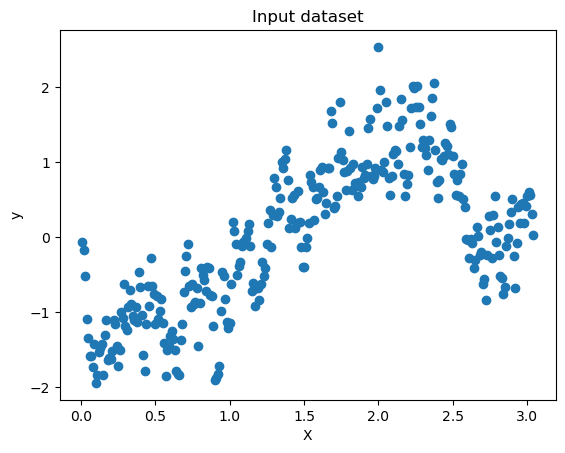

In [805]:
#Look at one year of temperature data over time
plt.scatter(x=index['index'], y=notempyear22_scaled['DEBILT_temp_mean']) #<----INSERT WEATHER STATION HERE
plt.xlabel('X'); plt.ylabel('y');
plt.title('Input dataset');

# Display the plot
plt.show()

In [807]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
notempyear22_scaled['DEBILT_temp_mean'].min()

-1.9458058542050627

In [809]:
#what is the max temperature? (Note gradient descent is not actually finding this number)
notempyear22_scaled['DEBILT_temp_mean'].max()

2.5334241370489248

## 5. Analyze DEBILT_temp_mean, 2022

In [812]:
#This computes the loss function for the gradiant descent. DO NOT CHANGE!

def compute_cost(X, y, theta=np.array([[0],[0]])):
    """Given covariate matrix X, the prediction results y and coefficients theta
    compute the loss"""
    
    m = len(y)
    J=0 # initialize loss to zero
    
    # reshape theta
    theta=theta.reshape(2,1)
    
    # calculate the hypothesis - y_hat
    h_x = np.dot(X,theta)
    #print(h_x)
    
    # subtract y from y_hat, square and sum
    error_term = sum((h_x - y)**2)
    
    # divide by twice the number of samples - standard practice.
    loss = error_term/(2*m)
    
    return loss

In [814]:
compute_cost(X,y)

array([0.5])

In [816]:
#This is the gradiant descent function. DO NOT CHANGE!

def gradient_descent(X, y, theta=np.array([[0],[0]]),
                    alpha=0.01, num_iterations=1500):
    """
    Solve for theta using Gradient Descent optimiztion technique. 
    Alpha is the learning rate
    """
    m = len(y)
    J_history = []
    theta0_history = []
    theta1_history = []
    theta = theta.reshape(2,1)
    
    for i in range(num_iterations):
        error = (np.dot(X, theta) - y)
        
        term0 = (alpha/m) * sum(error* X[:,0].reshape(m,1))
        term1 = (alpha/m) * sum(error* X[:,1].reshape(m,1))
        
        # update theta
        term_vector = np.array([[term0],[term1]])
        #print(term_vector)
        theta = theta - term_vector.reshape(2,1)
        
        # store history values
        theta0_history.append(theta[0].tolist()[0])
        theta1_history.append(theta[1].tolist()[0])
        J_history.append(compute_cost(X,y,theta).tolist()[0])
        
    return (theta, J_history, theta0_history, theta1_history)

In [818]:
%%time
#This runs your data through a gradiant descent for the starting conditions in 'theta_init.'
#You will need to adjust these numbers

num_iterations=50 #<---Decide how many iterations you need. Start small and work up. Over 10,000 iterations will take a few seconds.
theta_init=np.array([[-10],[-5]]) #<---this is where you put the guess for [theta0], [theta1]. Start with 1 and 1.
alpha=0.1 #<---Decide what your step size is. Try values between 0.1 and 0.00001. You will need to adjust your iterations.
#If your solution is not converging, try a smaller step size.
theta, J_history, theta0_history, theta1_history = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

CPU times: total: 0 ns
Wall time: 18.6 ms


In [820]:
theta

array([[-2.8423927 ],
       [ 1.64696299]])

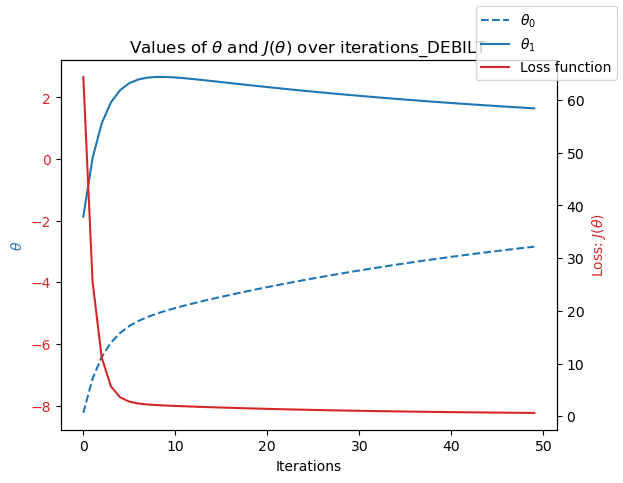

In [822]:
#This will plot your loss, theta0, and theta1.If the result looks like a straight line, it's not converging on an answer!
#Your loss (red) should be trending toward 0.

fig, ax1 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax1.plot(theta0_history, label='$\\theta_{0}$', linestyle='--', color=color)
ax1.plot(theta1_history, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax1.set_xlabel('Iterations'); ax1.set_ylabel('$\\theta$', color=color);
ax1.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax2 = ax1.twinx()
ax2.plot(J_history, label='Loss function', color=color)
ax2.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations_DEBILT')
ax2.set_ylabel('Loss: $J(\\theta)$', color=color)
ax1.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig.legend()

# Show the figure
plt.show() 


In [824]:
# find the minimum and maximum values of theta0 and theta1
theta0_min = min(theta0_history)
theta0_max = max(theta0_history)
theta1_min = min(theta1_history)
theta1_max = max(theta1_history)

print("Limits for theta0: ", theta0_min, "to", theta0_max)
print("Limits for theta1: ", theta1_min, "to", theta1_max)

Limits for theta0:  -8.237499999999999 to -2.8423927039090513
Limits for theta1:  -1.8681363393645407 to 2.666858972328776


In [826]:
%%time
# theta range
theta0_vals = np.linspace(-10,10,100) #Look in the chart above for the limits of where theta0 and theta1 appear.
theta1_vals = np.linspace(-10,10,100) #Put those values as the first two "linspace" numbers in these lines
                                      #Select with large margins, maybe +/- 10
J_vals = np.zeros((len(theta0_vals), len(theta1_vals)))

# compute cost for each combination of theta
c1=0; c2=0
for i in theta0_vals:
    for j in theta1_vals:
        t = np.array([i, j])
        J_vals[c1][c2] = compute_cost(X, y, t.transpose()).tolist()[0]
        c2=c2+1
    c1=c1+1
    c2=0 # reinitialize to 0

CPU times: total: 578 ms
Wall time: 1.18 s


In [828]:
#This figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

fig = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig.update_layout(title='Loss function for different thetas_DEBILT', autosize=True,
                  width=800, height=800, xaxis_title='theta0', 
                 yaxis_title='theta1')
fig.show()

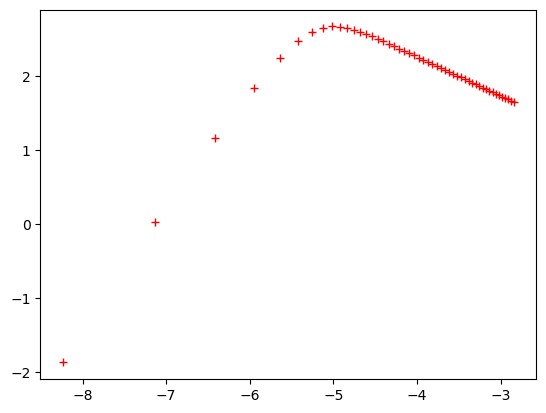

In [830]:
#Here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#Find where it is closest to 0 in X and Y!

#you can click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history, y=theta0_history, z=J_history, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history, theta1_history, 'r+');
fig.update_layout(title='Loss function for different thetas_DEBILT', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
#fig.show()
# Show the figure
plt.show() 

In [832]:
#Rerun the optimization above, but this time start closer to the objective!
#Find where the black line ends near the lowest X/Y/Z coordinate and make that your guess below.

num_iterations=50 #<---start with the same iterations as above
theta_init=np.array([[2],[-3]]) #<---make a guess as to a more accurate [x],[y] coordinates near the minimum in the graph above.
alpha= 0.1 #<---start with the same step size as above
theta1, J_history1, theta0_history1, theta1_history1 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

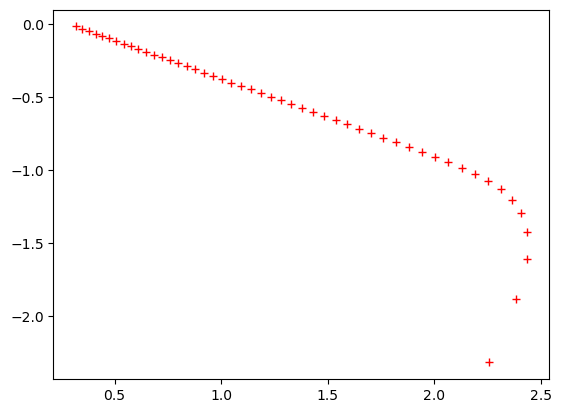

In [834]:
#Let's look at the new loss path on the function. It should start much closer to the goal

line_marker = dict(color='#101010', width=2)
fig = go.Figure()
fig.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig.add_scatter3d(x=theta1_history1, y=theta0_history1, z=J_history1, line=line_marker, name='')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history1, theta1_history1, 'r+');
fig.update_layout(title='Loss function for different thetas_DEBILT', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')
#fig.show()
# Show the figure
plt.show() 

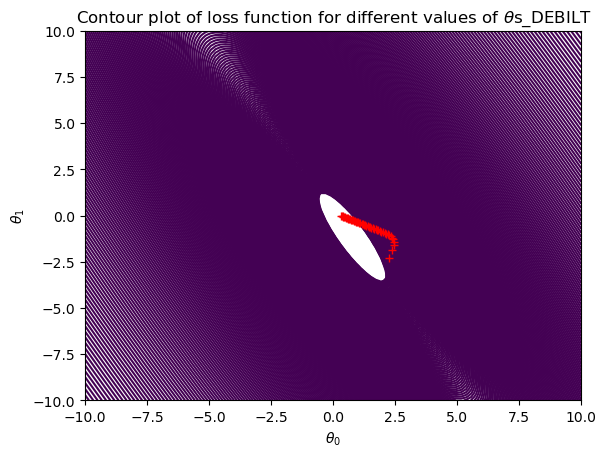

In [836]:
#This plot shows the convergence similar to above, but only in the X/Y plane (there's no height)

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s_DEBILT");
plt.plot(theta0_history1, theta1_history1, 'r+');

# Show the figure
plt.show() 

### How well does gradient descent converge? 

### How much do you need to adjust between different weather stations and years?


-----------------------------------------------------------------------------------------------------------------------------------------------------------

In [839]:
#How well does gradient descent converge? How much do you need to adjust between different weather stations and years?

---------------------------------------------------------------------------------------------------------------------------## 6. Analyze DUSSELDORF_Temp_Mean, 20212

In [842]:
#drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear1 = dfyear21.drop(['DATE','MONTH'], axis=1)

# Scaling data set
notempyear21_scaled = pd.DataFrame(scaler.fit_transform(notempyear1))
notempyear21_scaled.columns = notempyear1.columns

In [844]:
#plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate!

fig1 = go.Figure(data=[go.Surface(z=notempyear21_scaled.values)])
fig1.update_layout(title='Weather temperatures year 2021', autosize=False,
                  width=800, height=800)

fig1.show()

In [846]:
n_rows1 = notempyear21_scaled.shape[0]
n_rows1

365

In [848]:
#make an index for the year. 
#create a set of data from 1 to 365 (days)
#scale it by 100 as the index is made.

i = np.arange(0.01,3.66,0.01) #<---one GREATER than the total number of days
index1 = pd.DataFrame(data = i, columns = ['index1'])
index1

,index1
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
360,3.61
361,3.62
362,3.63
363,3.64


In [850]:
#this will translate our chosen weather data into the X and y datasets needed for the optimization function.

X=index1.to_numpy().reshape(n_rows1,1)

In [852]:
#represent x_0 as a vector of 1s for vector computation
ones1 = np.ones((n_rows1,1))
X = np.concatenate((ones1, X), axis=1)
y=notempyear21_scaled['DUSSELDORF_temp_mean'].to_numpy().reshape(n_rows1,1) #<----highest temp mean from our 3D plot

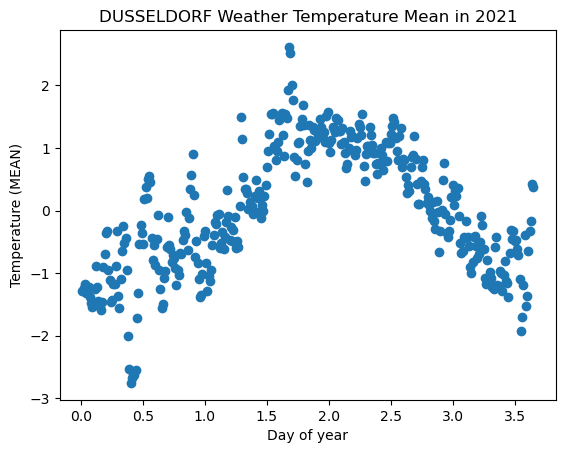

In [854]:
#look at one year of temperature data over time
plt.scatter(x=index1['index1'], y=notempyear21_scaled['DUSSELDORF_temp_mean'])
plt.xlabel('Day of year'); plt.ylabel('Temperature (MEAN)');
plt.title('DUSSELDORF Weather Temperature Mean in 2021');

# Show the figure
plt.show() 

In [856]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
notempyear21_scaled['DUSSELDORF_temp_mean'].min()

-2.7528789969460132

In [858]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
notempyear21_scaled['DUSSELDORF_temp_mean'].max()

2.613274118292951

In [860]:
num_iterations=100 #<---use same iterations
theta_init=np.array([[2],[-3]]) #<---make a guess [x],[y]
alpha= 0.1 #<---use the same step size
theta2, J_history2, theta0_history2, theta1_history2 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)

In [862]:
theta2

array([[-0.04962022],
       [ 0.07104985]])

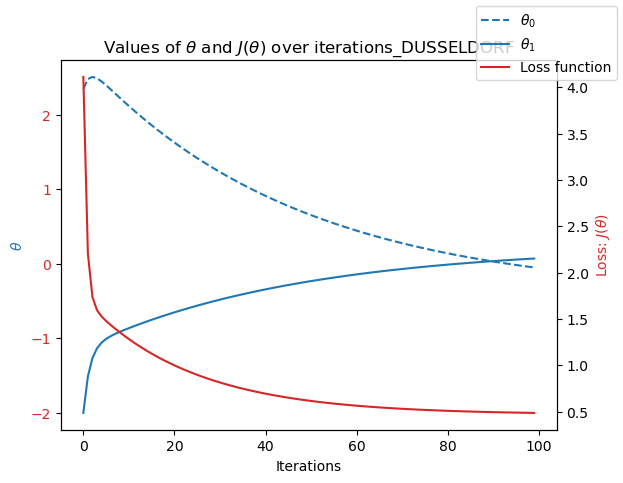

In [864]:
#this will plot the loss, theta0, and theta1.

fig1, ax2 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax2.plot(theta0_history2, label='$\\theta_{0}$', linestyle='--', color=color)
ax2.plot(theta1_history2, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax2.set_xlabel('Iterations'); ax2.set_ylabel('$\\theta$', color=color);
ax2.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax3 = ax2.twinx()
ax3.plot(J_history2, label='Loss function', color=color)
ax3.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations_DUSSELDORF')
ax3.set_ylabel('Loss: $J(\\theta)$', color=color)
ax2.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig1.legend()
# Show the figure
plt.show() 

In [866]:
#this figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#find where it is closest to 0 in X and Y!

#click/hold in the graph below to rotate!

fig1 = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig1.update_layout(title='Loss function for different thetas_DUSSELDORF', autosize=True,
                  width=800, height=800, xaxis_title='theta0', 
                 yaxis_title='theta1')

fig1.show()

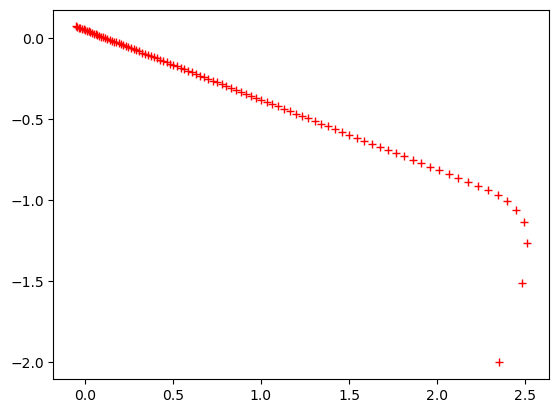

In [868]:
#here is the same figure as above, with the line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#find where it is closest to 0 in X and Y!

#click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig1 = go.Figure()
fig1.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig1.add_scatter3d(x=theta1_history2, y=theta0_history2, z=J_history2, line=line_marker, name='')
#the below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history2, theta1_history2, 'r+');
fig1.update_layout(title='Loss function for different thetas_DUSSELDORF', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')

# Show the figure
plt.show() 

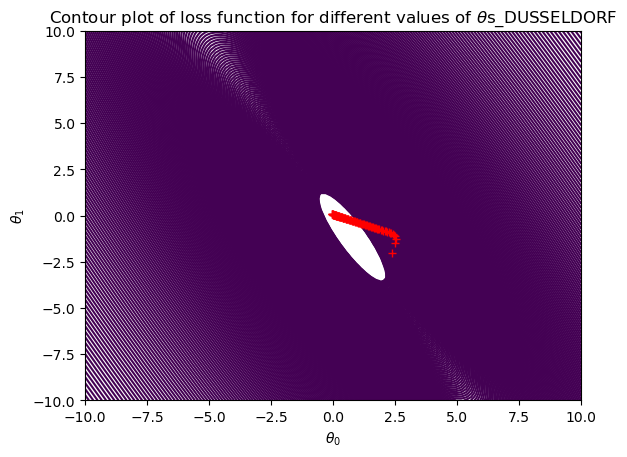

In [870]:
#plot shows the convergence

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s_DUSSELDORF");
plt.plot(theta0_history2, theta1_history2, 'r+');

# Show the figure
plt.show()

### How well does gradient descent converge? 

### How much do you need to adjust between different weather stations and years?


--------------------------------------------------------------------------------------------------------------------------------------------------

---------------------------------------------------------------------------------------------------------------------------
## 7. Analyz MAASTRICHT _Temp_Mean, 2020

In [874]:
#drop the DATE and MONTH data as those numbers are not scaled with the rest.
notempyear2 = dfyear20.drop(['DATE','MONTH'], axis=1)

# Scaling data set
notempyear20_scaled = pd.DataFrame(scaler.fit_transform(notempyear2))
notempyear20_scaled.columns = notempyear2.columns

In [876]:
#plot ALL weather data for all stations for a year 

#X = weather station
#Y = day of the year
#Z = temperature

#click/hold in the graph below to rotate!

fig2 = go.Figure(data=[go.Surface(z=notempyear20_scaled.values)])
fig2.update_layout(title='Weather temperatures year 2020', autosize=False,
                  width=800, height=800)

fig2.show()

In [878]:
n_rows2 = notempyear20_scaled.shape[0]
n_rows2

366

In [880]:
#make an index for the year. 
#create a set of data from 1 to 365 (days)
#scale it by 100 as the index is made.

i = np.arange(0.01,3.67,0.01) #<---one GREATER than the total number of days #LEAP YEAR
index2 = pd.DataFrame(data = i, columns = ['index2'])
index2

,index2
0,0.01
1,0.02
2,0.03
3,0.04
4,0.05
...,...
361,3.62
362,3.63
363,3.64
364,3.65


In [882]:
#this will translate our chosen weather data into the X and y datasets needed for the optimization function.

X=index2.to_numpy().reshape(n_rows2,1)

In [884]:
#represent x_0 as a vector of 1s for vector computation
ones2 = np.ones((n_rows2,1))
X = np.concatenate((ones2, X), axis=1)
y=notempyear20_scaled['MAASTRICHT_temp_mean'].to_numpy().reshape(n_rows2,1) #<----randomly chosen weather station

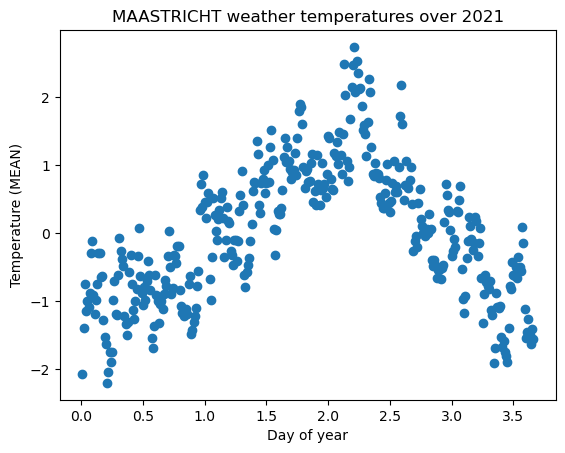

In [886]:
#look at one year of temperature data over time
plt.scatter(x=index2['index2'], y=notempyear20_scaled['MAASTRICHT_temp_mean'])
plt.xlabel('Day of year'); plt.ylabel('Temperature (MEAN)');
plt.title('MAASTRICHT weather temperatures over 2021');

plt.show()

In [888]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
notempyear20_scaled['MAASTRICHT_temp_mean'].min()

-2.2056083415447674

In [890]:
#what is the min temperature? (Note gradient descent is not actually finding this number)
notempyear20_scaled['MAASTRICHT_temp_mean'].max()

2.744238845291812

In [892]:
num_iterations=200 #<---use same iterations
theta_init=np.array([[2],[-3]]) #<---make a guess [x],[y]
alpha= 0.1 #<---use the same step size
theta3, J_history3, theta0_history3, theta1_history3 = gradient_descent(X,y, theta_init,
                                                                   alpha, num_iterations)


In [894]:
theta3

array([[-0.27179428],
       [ 0.15307319]])

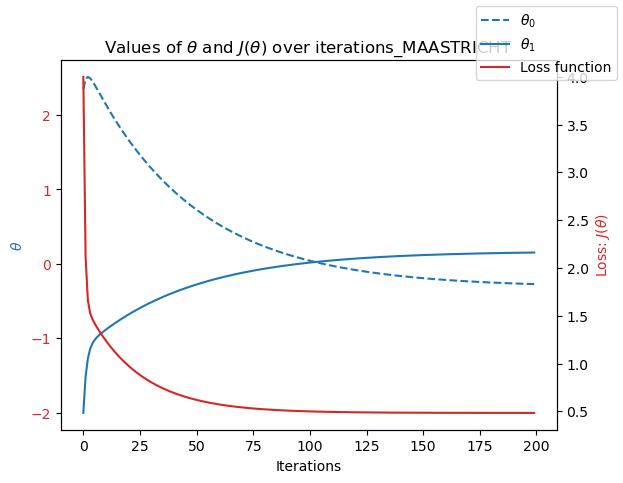

In [896]:
#This will plot the loss, theta0, and theta1.

fig2, ax3 = plt.subplots()

# plot thetas over time
color='tab:blue'
ax3.plot(theta0_history3, label='$\\theta_{0}$', linestyle='--', color=color)
ax3.plot(theta1_history3, label='$\\theta_{1}$', linestyle='-', color=color)
# ax1.legend()
ax3.set_xlabel('Iterations'); ax3.set_ylabel('$\\theta$', color=color);
ax3.tick_params(axis='y', labelcolor=color)

# plot loss function over time
color='tab:red'
ax4 = ax3.twinx()
ax4.plot(J_history3, label='Loss function', color=color)
ax4.set_title('Values of $\\theta$ and $J(\\theta)$ over iterations_MAASTRICHT')
ax4.set_ylabel('Loss: $J(\\theta)$', color=color)
ax3.tick_params(axis='y', labelcolor=color)

# ax2.legend();
fig2.legend()
plt.show()

In [898]:
#this figure shows the loss function.

#X = Theta0
#Y - Theta1
#Z = Loss
#find where it is closest to 0 in X and Y!

#click/hold in the graph below to rotate!

fig2 = go.Figure(data=[go.Surface(x=theta1_vals, y=theta0_vals, z=J_vals)])
fig2.update_layout(title='Loss function for different thetas_MAASTRICHT', autosize=True,
                  width=800, height=800, xaxis_title='theta0', 
                 yaxis_title='theta1')

fig2.show()

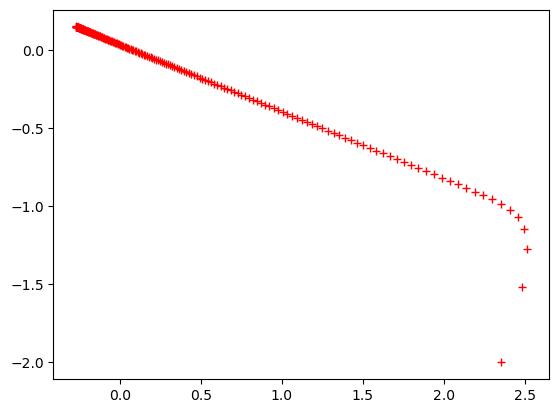

In [900]:
#line the loss function takes toward the minimum.

#X = Theta0
#Y - Theta1
#Z = Loss
#black line = path of loss function over the iterations.
#find where it is closest to 0 in X and Y!

#click/hold in the graph below to rotate!

line_marker = dict(color='#101010', width=2)
fig2 = go.Figure()
fig2.add_surface(x=theta1_vals, y=theta0_vals, z=J_vals)
fig2.add_scatter3d(x=theta1_history3, y=theta0_history3, z=J_history3, line=line_marker, name='path of convergence')
#The below line adds a graph of just the loss over iterations in a 2D plane
plt.plot(theta0_history3, theta1_history3, 'r+');
fig2.update_layout(title='Loss function for different thetas_MAASTRICHT', autosize=True,
                  width=600, height=600, xaxis_title='theta0', 
                 yaxis_title='theta1')

plt.show()

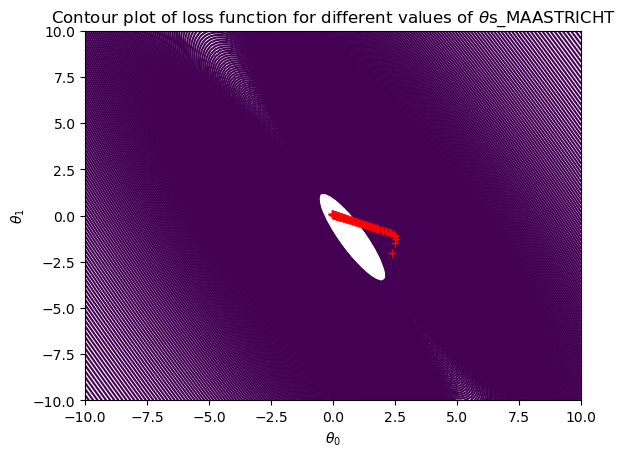

In [902]:
#show convergence

plt.contour(theta0_vals, theta1_vals, J_vals, levels = np.logspace(0,10,1000))
plt.xlabel('$\\theta_{0}$'); plt.ylabel("$\\theta_{1}$")
plt.title("Contour plot of loss function for different values of $\\theta$s_MAASTRICHT");
plt.plot(theta0_history2, theta1_history2, 'r+');

plt.show()

### How well does gradient descent converge? 

### How much do you need to adjust between different weather stations and years?


--------------------------------------------------------------------------------------------------------------------------------------------------